# 02456 - Deep Learning Project

Group members:
 - Benjamin Pedersen Rasmussen (s234911)
 - Raquel Moleiro Marques (s243636)
 - Sree Keerthi Desu (s243933)
 - Ting-Hui Cheng (s232855)

### Imports

In [1]:
import torch
from torch import nn
import torch.nn.functional as F
import torch.optim as optim
import torch.nn.init as init
import os
%matplotlib inline
import matplotlib
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import cv2

from torch.nn.parameter import Parameter
from torchvision import datasets, transforms
from torch.utils.data import Dataset, DataLoader, random_split

## Data Preparation

In [2]:
image_list = []

# Specify the folder path
folder_path = "data/photo_jpg"

# Get a list of all the image files in the folder
image_files = [
    f for f in os.listdir(folder_path) if f.endswith(".jpg") or f.endswith(".png")
]

# Iterate through the image files
for image_file in image_files:
    # Open the image file
    img = Image.open(os.path.join(folder_path, image_file))
    # Convert the image to an array
    img_array = np.array(img)
    # Append the image array to the list
    image_list.append(img_array)

print(image_list)

[array([[[ 91,  91,  93],
        [ 97,  97,  99],
        [104, 104, 106],
        ...,
        [103, 108, 111],
        [103, 108, 111],
        [101, 106, 109]],

       [[ 80,  80,  82],
        [ 85,  85,  87],
        [ 91,  91,  93],
        ...,
        [116, 121, 124],
        [114, 119, 122],
        [112, 117, 120]],

       [[ 81,  81,  83],
        [ 84,  84,  86],
        [ 87,  87,  89],
        ...,
        [114, 119, 123],
        [111, 116, 120],
        [109, 114, 118]],

       ...,

       [[ 31,  27,  18],
        [ 11,   7,   0],
        [ 31,  27,  18],
        ...,
        [ 81,  60,  41],
        [ 68,  47,  28],
        [ 50,  32,  12]],

       [[ 27,  22,  16],
        [ 16,  12,   3],
        [ 26,  22,  13],
        ...,
        [ 66,  45,  28],
        [ 77,  58,  41],
        [ 84,  65,  50]],

       [[ 37,  32,  26],
        [ 25,  20,  14],
        [ 15,  11,   2],
        ...,
        [ 33,  14,   0],
        [ 37,  18,   3],
        [ 59,  40,  25]

# Exploratory Data Analysis (EDA)

In [3]:
# access folders
path_monet = "data/monet_jpg/"
path_photo = "data/photo_jpg/"

print("Number of monet paintings: {}".format(len(os.listdir(path_monet))))
print("Number of photos: {}".format(len(os.listdir(path_photo))))

Number of monet paintings: 300
Number of photos: 7038


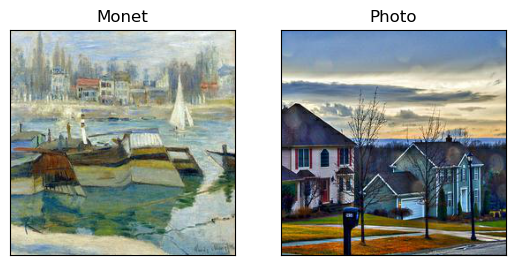

In [4]:
random_index = int(np.random.uniform(0, len(os.listdir(path_monet))))
example_monet = os.listdir(path_monet)[random_index]
example_photo = os.listdir(path_photo)[random_index]

plt.subplot(121)
plt.title('Monet')
plt.imshow(Image.open(os.path.join(path_monet, example_monet)))
plt.xticks([])
plt.yticks([])

plt.subplot(122)
plt.title('Photo')
plt.imshow(Image.open(os.path.join(path_photo, example_photo)))
plt.xticks([])
plt.yticks([])
plt.show()

In [5]:
# function to display the present color channels in an image alongside the image itself
def display_color_channels(path):
    plt.figure(figsize=(16, 4))
    
    img = cv2.imread(path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) 
    plt.subplot(1, 4, 1)
    plt.imshow(img)
    plt.axis("off")
    
    colors = ["red", "green", "blue"]
    for i in range(len(colors)):
        plt.subplot(1, 4, i + 2)
        plt.hist(
            img[:, :, i].reshape(-1),
            bins=50,
            color=colors[i],
            density=True
        )
        plt.xlim(0, 255)
        plt.xticks([])
        plt.yticks([])
     
    plt.show()

Monet:


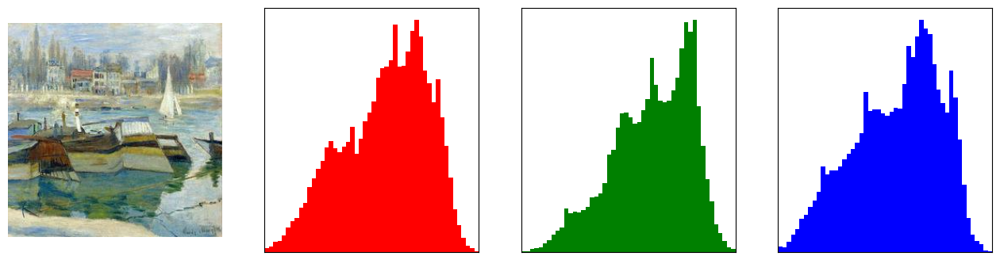

Photo:


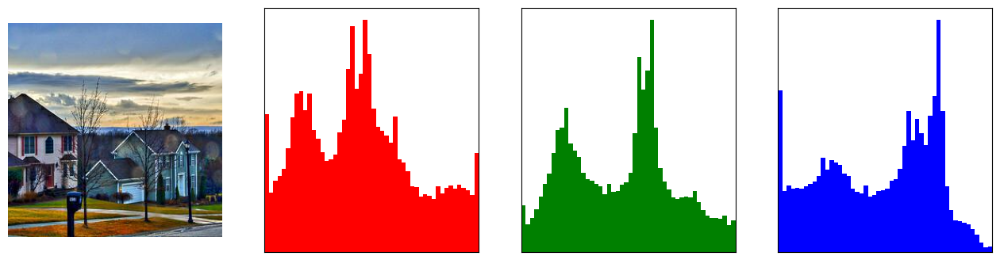

In [6]:
# show monet example color channels
print("Monet:")
display_color_channels(os.path.join(path_monet, example_monet))
print("Photo:")
display_color_channels(os.path.join(path_photo, example_photo))

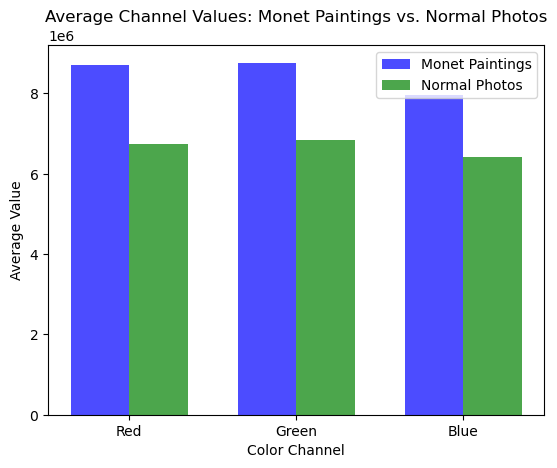

In [7]:
# function to calculate the average channel values (Red, Green, Blue)
def calculate_average_channel_values(image_dir):
    
    # init each channel (R, G, B)
    channel_sum = np.zeros(3) 
    total_images = 0

    for image_filename in os.listdir(image_dir):
        img = Image.open(os.path.join(image_dir, image_filename))
        img_array = np.array(img)
        
        # make sure it is a color image
        if img_array.shape == (256, 256, 3):
            channel_sum += np.sum(img_array, axis=(0, 1))
            total_images += 1

    average_channel_values = channel_sum / total_images
    return average_channel_values

# calculate average channel values
average_monet_values = calculate_average_channel_values(path_monet)
average_photos_values = calculate_average_channel_values(path_photo)

# ceate bar charts to compare average channel values
channels = ['Red', 'Green', 'Blue']
x = np.arange(len(channels))
width = 0.35

plt.bar(x - width/2, average_monet_values, width, label='Monet Paintings', color='b', alpha=0.7)
plt.bar(x + width/2, average_photos_values, width, label='Normal Photos', color='g', alpha=0.7)

plt.xlabel('Color Channel')
plt.ylabel('Average Value')
plt.title('Average Channel Values: Monet Paintings vs. Normal Photos')
plt.xticks(x, channels)
plt.legend()
plt.show()

# Model Building

In [8]:
IMAGE_SIZE = [256,256]

class DataLoader(Dataset):
    def __init__(self, _path, transform=True):
        self._path = _path
        # Memoize path indices for later
        self.monet_indices = dict()
        self.photo_indices = dict()

        if transform:
            # Default 0-1 norm´
            self.transform = transforms.Compose((
                transforms.Resize(IMAGE_SIZE, antialias=False),
                transforms.ToTensor(),
                
                )
            )
        self.monets = os.listdir(_path + "/monet_jpg")
        self.photos = os.listdir(_path + "/photo_jpg")

        for i, fl in enumerate(self.monets):
            self.monet_indices[i] = fl
        for i, fl in enumerate(self.photos):
            self.photo_indices[i] = fl

    def __len__(self):
        return min(len(self.monets), len(self.photos))

    def __getitem__(self, index):
        random_index = int(np.random.uniform(0, len(self.monet_indices.keys())))
        monet_src = Image.open(os.path.join(self._path, "monet_jpg", self.monet_indices[index % 300]))   
        photo_src = Image.open(os.path.join(self._path, "photo_jpg", self.photo_indices[random_index]))
        monet_src = self.transform(monet_src)
        photo_src = self.transform(photo_src)
        return photo_src, monet_src


dataset = DataLoader("./data")
# cur_max = 0
# for (idx, i) in enumerate(dataset):
#     # Stop after 10 images, or infinite loop
#     if (idx+1) % 300==0:
#         break

#     photo, monet = i[0],i[1]
#     for j in range(2): # col
#         for x in range(255): 
#             for y in range(255):
#                 if monet[j][x][y] < cur_max:
#                     cur_max = monet[j][x][y]
#     print(cur_max)



In [ ]:
'''
@inproceedings{kinoshita2020fixed,
author = {Kinoshita, Yuma and Kiya, Hitoshi},
booktitle = {Proceedings of IEEE International Conference on Acoustics, Speech and Signal Processing},
doi = {10.1109/ICASSP40776.2020.9054096},
isbn = {978-1-5090-6631-5},
month = {May},
pages = {3712--3716},
publisher = {IEEE},
title = {{Fixed Smooth Convolutional Layer for Avoiding Checkerboard Artifacts in CNNs}},
url = {https://ieeexplore.ieee.org/document/9054096/},
year = {2020}
}
'''
import math
import torch
import torch.nn as nn
from torch.nn.parameter import Parameter
from torch.nn.init import constant_
import torch.nn.functional as F
from itertools import repeat
import collections.abc


def _ntuple(n):
    """Translate a float value to n-dim tuple
    Examples
    --------
    >>> a = _ntuple(2)
    >>> a(10)
    (10, 10)
    >>> b = _ntuple(5)
    >>> b(-2)
    (-2, -2, -2, -2, -2)
    Aliases
    -------
    >>> _single(2)
    (2,)
    >>> _pair(2)
    (2, 2)
    >>> _triple(2)
    (2, 2, 2)
    >>> _quadruple(2)
    (2, 2, 2, 2)
    """
    def parse(x):
        if isinstance(x, collections.abc.Iterable):
            return x
        return tuple(repeat(x, n))
    return parse


_single = _ntuple(1)
_pair = _ntuple(2)
_triple = _ntuple(3)
_quadruple = _ntuple(4)


def _generate_hold_kernel(in_channels, zoh_kernel_size, order):
    """Convolve a zero-order hold kernel with the size of *zoh_kernel_size* *order* times
    Examples
    --------
    >>> _generate_hold_kernel(1, 2, 0)
    tensor([[[[1., 1.],
              [1., 1.]]]])
    >>> _generate_hold_kernel(1, 2, 1)
    tensor([[[[1., 2., 1.],
              [2., 4., 2.],
              [1., 2., 1.]]]])
    """
    zoh_kernel_size = _pair(zoh_kernel_size)

    # Zero-order hold kernel
    zoh_kernel = torch.Tensor(1, 1, *zoh_kernel_size)
    constant_(zoh_kernel, 1.0)
    tmp_kernel = zoh_kernel.clone()
    for i in range(order):
        tmp_kernel = F.conv2d(
            tmp_kernel, zoh_kernel, bias=None, stride=(1, 1),
            padding=((zoh_kernel_size[1]+1)//2,
                     (zoh_kernel_size[0]+1)//2),
            dilation=(1, 1), groups=1)
    return torch.repeat_interleave(tmp_kernel, in_channels, dim=0)


class DownSampling2d(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size, stride=1,
                 padding=0, dilation=1, groups=1, 
                 bias=True, padding_mode='zeros',
                 order=0, hold_mode='hold_first', bias_mode='bias_first'):
        super(DownSampling2d, self).__init__()
        self.hold_mode = hold_mode
        self.bias_mode = bias_mode

        if hold_mode == "hold_first":
            hold_in_channels = in_channels
        elif hold_mode == "hold_last":
            hold_in_channels = out_channels
        elif hold_mode == "kernel_conv":
            hold_in_channels = None
        else:
            raise(NotImplementedError())

        if hold_mode == "kernel_conv":
            self.conv = KernelConv2d(
                in_channels, out_channels, kernel_size, stride=stride,
                padding=padding, dilation=dilation, groups=groups,
                bias=bias, padding_mode=padding_mode, order=order)
        elif bias_mode == "bias_first":
            self.hold_conv = HoldConv2d(
                in_channels=hold_in_channels, zoh_kernel_size=stride,
                order=order, stride=1, padding=0, bias=bias,
                padding_mode='zeros')
            self.conv = nn.Conv2d(
                in_channels, out_channels, kernel_size, stride=stride,
                padding=padding, dilation=dilation, groups=groups,
                bias=False, padding_mode=padding_mode)
        elif bias_mode == "bias_last":
            self.hold_conv = HoldConv2d(
                in_channels=hold_in_channels, zoh_kernel_size=stride,
                order=order, stride=1, padding=0, bias=False,
                padding_mode='zeros')
            self.conv = nn.Conv2d(
                in_channels, out_channels, kernel_size, stride=stride,
                padding=padding, dilation=dilation, groups=groups,
                bias=bias, padding_mode=padding_mode)

    def forward(self, x):
        if self.hold_mode == "hold_first":
            x = self.hold_conv(x)
            x = self.conv(x)
        elif self.hold_mode == "hold_last":
            raise(NotImplementedError())
        else:
            x = self.conv(x)

        return x


class HoldConv2d(nn.Module):
    def __init__(self, in_channels, zoh_kernel_size, order=0, stride=1,
                 padding=0, dilation=1, bias=True, padding_mode='zeros'):

        super(HoldConv2d, self).__init__()
        self.in_channels = in_channels
        self.out_channels = in_channels
        self.zoh_kernel_size = _pair(zoh_kernel_size)
        self.order = order
        self.stride = _pair(stride)
        self.padding = _pair(padding)
        self.dilation = _pair(dilation)
        self.groups = in_channels
        self.padding_mode = padding_mode

        kernel = _generate_hold_kernel(in_channels,
                                       self.zoh_kernel_size,
                                       self.order)
        self.kernel = Parameter(kernel, requires_grad=False)
        self.kernel_size = self.kernel.size()[2:]

        if bias:
            self.bias = Parameter(torch.Tensor(self.out_channels))
        else:
            self.register_parameter('bias', None)
        self.reset_parameters()

    def reset_parameters(self):
        if self.bias is not None:
            fan_in, _ = torch.nn.init._calculate_fan_in_and_fan_out(self.kernel)
            bound = 1 / math.sqrt(fan_in)
            torch.nn.init.uniform_(self.bias, -bound, bound)

    def forward(self, input):
        expanded_padding = (self.kernel_size[1] // 2,
                            (self.kernel_size[1]-1) // 2,
                            self.kernel_size[0] // 2,
                            (self.kernel_size[0]-1) // 2)
        input = F.pad(input, expanded_padding)
        if self.padding_mode == 'circular':
            expanded_padding = ((self.padding[1] + 1) // 2, self.padding[1] // 2,
                                (self.padding[0] + 1) // 2, self.padding[0] // 2)
            return F.conv2d(F.pad(input, expanded_padding, mode='circular'),
                            self.kernel, self.bias, self.stride,
                            _pair(0), self.dilation, self.groups)
        return F.conv2d(input, self.kernel, self.bias, self.stride,
                        self.padding, self.dilation, self.groups)


class KernelConv2d(nn.Conv2d):
    def __init__(self, in_channels, out_channels, kernel_size, stride=1,
                 padding=0, dilation=1, groups=1,
                 bias=True, padding_mode='zeros', order=0):
        super(KernelConv2d, self).__init__(
            in_channels, out_channels, kernel_size, stride, padding, dilation,
            groups, bias, padding_mode)

        self.order = order
        kernel = _generate_hold_kernel(in_channels,
                                       self.stride,
                                       self.order)
        self.hold_kernel = Parameter(kernel, requires_grad=False)
        self.hold_kernel_size = self.hold_kernel.size()[2:]

    def forward(self, input):
        padding = ((self.hold_kernel_size[1]+1)//2,
                   (self.hold_kernel_size[0]+1)//2)
        kernel = F.conv2d(
                    self.weight, self.hold_kernel, bias=None, stride=(1, 1),
                    padding=padding,
                    dilation=(1, 1), groups=self.in_channels)
        kernel_size = kernel.size()[2:]
        expanded_padding = (kernel_size[1] // 2 - padding[1],
                            (kernel_size[1]-1) // 2 - padding[1],
                            kernel_size[0] // 2 - padding[0],
                            (kernel_size[0]-1) // 2 - padding[0])
        input = F.pad(input, expanded_padding)
        if self.padding_mode == 'circular':
            expanded_padding = ((self.padding[1] + 1) // 2, self.padding[1] // 2,
                                (self.padding[0] + 1) // 2, self.padding[0] // 2)
            return F.conv2d(F.pad(input, expanded_padding, mode='circular'),
                            kernel, self.bias, self.stride,
                            _pair(0), self.dilation, self.groups)
        return F.conv2d(input, kernel, self.bias, self.stride,
                        self.padding, self.dilation, self.groups)


class UpSampling2d(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size, stride=1,
                 padding=0, dilation=1, groups=1,
                 bias=True, padding_mode='zeros',
                 order=0, hold_mode='hold_first', bias_mode='bias_first'):
        super(UpSampling2d, self).__init__()
        self.hold_mode = hold_mode
        self.bias_mode = bias_mode

        if hold_mode == "hold_first":
            hold_in_channels = in_channels
        elif hold_mode == "hold_last":
            hold_in_channels = out_channels
        elif hold_mode == "kernel_conv":
            raise(NotImplementedError())
        else:
            raise(NotImplementedError())

        if hold_mode == "kernel_conv":
            pass
        elif bias_mode == "bias_first":
            self.hold_conv = HoldConv2d(
                in_channels=hold_in_channels, zoh_kernel_size=stride,
                order=order, stride=1, padding=0, bias=False,
                padding_mode='zeros')
            self.trans_conv = nn.ConvTranspose2d(
                in_channels, out_channels, kernel_size, stride=stride,
                padding=padding, dilation=dilation, groups=groups,
                bias=bias, padding_mode=padding_mode)
        elif bias_mode == "bias_last":
            self.hold_conv = HoldConv2d(
                in_channels=hold_in_channels, zoh_kernel_size=stride,
                order=order, stride=1, padding=0, bias=bias,
                padding_mode='zeros')
            self.trans_conv = nn.ConvTranspose2d(
                in_channels, out_channels, kernel_size, stride=stride,
                padding=padding, dilation=dilation, groups=groups,
                bias=False, padding_mode=padding_mode)

    def forward(self, x):
        if self.hold_mode == "hold_first":
            raise(NotImplementedError())
        elif self.hold_mode == "hold_last":
            x = self.trans_conv(x)
            x = self.hold_conv(x)
        else:
            x = self.trans_conv(x)

        return x
up_conv = UpSampling2d(64, 64, 2, stride=2,
                           padding=0, dilation=1, groups=1,
                           bias=True, padding_mode='zeros',
                           order=0, hold_mode='hold_first', bias_mode='bias_first')

    

In [ ]:

class ConvolutionalBlock(nn.Module):
    def __init__(self,
                 in_channel: int,
                 out_channel: int,
                 is_downsampling: bool = True,
                 add_activation: bool = True,
                 apply_dropout=False,
                 bias = True,
                 **kwarg):
        super(ConvolutionalBlock, self).__init__()
        layers = list()
        stride = kwarg.get("stride", None)

        if is_downsampling:
            # layers.append(HoldConv2d( 
            #     in_channels=in_channel, zoh_kernel_size=stride, 
            #     stride=1, padding=0, bias=bias, order=0,
            #     padding_mode='zeros')) 
            
            
            # layers.append(nn.Conv2d(
            #     in_channel, out_channel, padding_mode="reflect", bias=False,  **kwarg))
            
            layers.append(DownSampling2d(in_channel, out_channel, **kwarg, dilation=1, groups=1,
                          bias=True, padding_mode="reflect",
                          order=0, hold_mode='hold_first', bias_mode='bias_first'))
            layers.append(nn.InstanceNorm2d(out_channel))
            layers.append(nn.LeakyReLU(negative_slope=0.2, inplace=True) if add_activation else nn.Identity())
        else:

            
            layers.append(nn.ConvTranspose2d(in_channel, out_channel, **kwarg))
            layers.append(HoldConv2d( 
                in_channels=out_channel, zoh_kernel_size=stride, 
                stride=1, padding=0, bias=False,
                padding_mode='zeros')) 
            
            # layers.append(UpSampling2d(in_channel, out_channel, **kwarg , dilation=1, groups=1,
            #                bias=True, padding_mode='zeros',
            #                order=0, hold_mode='hold_last', bias_mode='bias_first'))
            
            layers.append(nn.InstanceNorm2d(out_channel))
            
            if apply_dropout:
                layers.append(nn.Dropout(0.5))
            layers.append(nn.ReLU(inplace=True) if add_activation else nn.Identity())


        
        self.ConvB = nn.Sequential(*layers)
    def forward(self, x):
        unsqueezed = False
        # if x.dim() == 3:  # Check if input is (C, H, W)
        #     x = x.unsqueeze(0)  # Add batch dimension
        #     unsqueezed = True
        x = self.ConvB(x)
        # if unsqueezed:  # Remove batch dimension if it was added
        #     x = x.squeeze(0)
        return x

In [11]:
class ResidualBlock(nn.Module):
    def __init__(self,
                 channel: int,
                 **kwarg):
        super().__init__()
        self.block = nn.Sequential(
            ConvolutionalBlock(channel, channel, add_activation=True, apply_dropout=True, kernel_size=3, padding=1),
            ConvolutionalBlock(channel, channel, add_activation=False, kernel_size=3, padding=1),
        )
        
    def forward(self, x):
        return x + self.block(x)

In [118]:
class Generator(nn.Module):
    """
        Generator 
        Consists of 2 layers of downsampling layer, 
        6 residual blocks and then 2 upsampling layer. 
    """
    
    def __init__(self, 
                 input_channel: int, 
                 features: int = 64, 
                 num_residuals: int = 6,
                 smoothness=1):
        super().__init__()
        self.first_layer = nn.Sequential(
            nn.Conv2d(input_channel, features, kernel_size=7, stride=1, padding=3, padding_mode="reflect"),
            nn.InstanceNorm2d(features),
            nn.ReLU(inplace=True),
        )
        self.downsampling_layer = nn.Sequential(
            ConvolutionalBlock(features, features*2, is_downsampling = True, add_activation= True, apply_dropout=True, kernel_size=3, stride=2, padding=1),
            ConvolutionalBlock(features*2, features*4, is_downsampling = True, add_activation= True, apply_dropout=True, kernel_size=3, stride=2, padding=1)
        )
        self.residual_layer = nn.Sequential(
            *[ResidualBlock(features * 4) for _ in range(num_residuals)]
        )
        self.upsampling_layer = nn.Sequential(
            ConvolutionalBlock(features*4, features*2, is_downsampling = False, add_activation= True, kernel_size=3, stride=2, padding=1, output_padding=1),
            ConvolutionalBlock(features*2, features, is_downsampling = False, add_activation= True, kernel_size=3, stride=2, padding=1, output_padding=1)
        )
        # self.upsampling_layer = nn.Sequential(
        #     ConvolutionalBlock(features*4, features*2, is_downsampling = False, add_activation= True, kernel_size=3, stride=1, padding=1, padding_mode='reflect'),
        #     ConvolutionalBlock(features*2, features, is_downsampling = False, add_activation= True, kernel_size=3, stride=1, padding=1, padding_mode='reflect')
        # )
        self.last_layer = nn.Sequential(
            nn.Conv2d(features, input_channel, kernel_size=7, stride=1, padding=3, padding_mode="reflect"),
            nn.Tanh()
        )
    
    def forward(self, x):
        # print("Input size:", x.size())
        # x = self.first_layer(x)
        # print("After first layer:", x.size())
        # x = self.downsampling_layer(x)
        # print("After downsampling:", x.size())
        # x = self.residual_layer(x)
        # print("After residuals:", x.size())
        # x = self.upsampling_layer(x)
        # print("After upsampling:", x.size())
        # x = self.last_layer(x)
        # print("Final output size:", x.size())

        x = self.first_layer(x)
        x = self.downsampling_layer(x)
        x = self.residual_layer(x)
        x = self.upsampling_layer(x)
        x = self.last_layer(x)
        return x

In [13]:
class Discriminator(nn.Module):
    """
        Discriminator 
        Consists of 3 Convolution-InstanceNorm-LeakyReLU block
    """

    def __init__(self, 
                 input_channel: int, 
                 features: int = 64, 
                 num_layers: int = 4):
        super().__init__()

        layers = list()
        layers.append(nn.Conv2d(input_channel, features, kernel_size=4, stride=2, padding=1, padding_mode="reflect"))
        layers.append(nn.LeakyReLU(0.2, inplace=True))

        for i in range(1, num_layers):
            in_channel = features * 2 ** (i-1)
            out_channel = in_channel * 2

            if i == num_layers - 1:
                layers.append(self.Convlayer(in_channel, out_channel, 4, 1))
            else:
                layers.append(self.Convlayer(in_channel, out_channel, 4, 2))

        layers.append(nn.Conv2d(out_channel, 1, kernel_size=4, stride=1, padding=1))
        layers.append(nn.Sigmoid())  

        self.Disc = nn.Sequential(*layers)

    def Convlayer(self, in_ch, out_ch, kernel_size, stride, use_leaky=True, use_inst_norm=True, use_pad=True):
        if use_pad:
            conv = nn.Conv2d(in_ch, out_ch, kernel_size, stride, 1, bias=True, padding_mode="reflect")
        else:
            conv = nn.Conv2d(in_ch, out_ch, kernel_size, stride, 0, bias=True, padding_mode="reflect")

        if use_leaky:
            actv = nn.LeakyReLU(negative_slope=0.2, inplace=True)
        else:
            actv = nn.ReLU(inplace=True)

        if use_inst_norm:
            norm = nn.InstanceNorm2d(out_ch)
        else:
            norm = nn.BatchNorm2d(out_ch)

        return nn.Sequential(conv, norm, actv)
    
    def forward(self, x):
        return self.Disc(x)

In [121]:
from itertools import chain
from tqdm import tqdm
from torch.cuda.amp import autocast, GradScaler


class Model(torch.nn.Module):
    def __init__(self, epochs, device, cycle_lambda = 10, Learning_rate=2e-4):
        super(Model,self).__init__()
        self.device = device
        
        self.gen_monet2photo = Generator(input_channel=3).to(self.device)
        self.gen_photo2monet = Generator(input_channel=3).to(self.device)
        self.disc_monet = Discriminator(input_channel=3).to(self.device)
        self.disc_photo = Discriminator(input_channel=3).to(self.device)

        # Optimizer for the generator and discriminators
        self.opt_gen = torch.optim.Adam(chain(self.gen_monet2photo.parameters(), self.gen_photo2monet.parameters()),
                                         lr = Learning_rate,
                                         betas= (0.5, 0.999))
        self.opt_disc = torch.optim.Adam(chain(self.disc_monet.parameters(), self.disc_photo.parameters()),
                                         lr = Learning_rate,
                                         betas= (0.5, 0.999))
        
        self.L1 = nn.L1Loss().to(self.device)
        self.mse = nn.MSELoss().to(self.device) 
        self.cycle_lambda = cycle_lambda
        self.epochs = epochs

        self.D_scaler = GradScaler()
        self.G_scaler = GradScaler()
        

    def init_weights(self):
        pass

    def train(self, dataloader):
        for epoch in range(self.epochs):
            avg_G_loss = 0.0
            avg_D_loss = 0.0

            reals = 0
            fakes = 0
            print("\nEpoch {}/{}".format(epoch+1, self.epochs))
            loop = tqdm(dataloader, leave=True, total=len(dataloader))
            for i, (photo, monet) in enumerate(loop):
                photo, monet = photo.to(self.device), monet.to(self.device)
                
                if i >= len(dataloader) - 1:  # Ensure no more than the intended batches
                    break

                # Train discriminators Between photo and monet
                with autocast():
                    # Generate fake photo to train photos discriminator 
                    fake_photo = self.gen_monet2photo(monet)
                    D_photo = self.disc_photo(photo)
                    D_fake_photo = self.disc_photo(fake_photo.detach())
                    reals += D_photo.mean().item()
                    fakes += D_fake_photo.mean().item()
                    # Use the mean squared error between the discriminator output
                    # and the label (Real photo is 1 and the generated one is 0)
                    D_real_photo_loss = self.mse(D_photo, torch.ones_like(D_photo))
                    D_fake_photo_loss = self.mse(D_fake_photo, torch.zeros_like(D_fake_photo))
                    D_photo_loss = (D_real_photo_loss + D_fake_photo_loss) / 2

                    # Generate fake monet pictures to train monets discriminator
                    fake_monet = self.gen_photo2monet(photo)
                    D_monet = self.disc_monet(monet)
                    D_fake_monet = self.disc_monet(fake_monet.detach())
                    # Use the mean squared error between the discriminator output
                    # and the label (Real monet is 1 and the generated monet is 0)
                    D_real_monet_loss = self.mse(D_monet, torch.ones_like(D_monet))
                    D_fake_monet_loss = self.mse(D_fake_monet, torch.zeros_like(D_fake_monet))
                    D_monet_loss = (D_real_monet_loss + D_fake_monet_loss) / 2
                    total_D_loss = D_monet_loss + D_photo_loss
                    avg_D_loss += total_D_loss.item()
                self.opt_disc.zero_grad()
                self.D_scaler.scale(total_D_loss).backward()  
                self.D_scaler.step(self.opt_disc)  
                self.D_scaler.update() 
                

                # Train generators for photo and monet images
                with autocast():

                    # adversarial losses
                    D_fake_photo = self.disc_photo(fake_photo.detach())
                    D_fake_monet = self.disc_monet(fake_monet.detach())
                    G_fake_photo_loss = self.mse(D_fake_photo, torch.zeros_like(D_fake_photo))
                    G_fake_monet_loss = self.mse(D_fake_monet, torch.zeros_like(D_fake_monet))
    
                    # cycle losses
                    cycle_monet = self.gen_photo2monet(fake_photo)
                    cycle_photo = self.gen_monet2photo(fake_monet)
                   
                    cycle_monet_loss = self.L1(monet, cycle_monet)
                    cycle_photo_loss = self.L1(photo, cycle_photo)
    
                    # total loss
                    total_G_loss = (
                        G_fake_photo_loss
                        + G_fake_monet_loss
                        + cycle_monet_loss * self.cycle_lambda
                        + cycle_photo_loss * self.cycle_lambda
                    )
                    avg_G_loss += total_G_loss.item()
                self.opt_gen.zero_grad()
                self.G_scaler.scale(total_G_loss).backward()  
                self.G_scaler.step(self.opt_gen)  
                self.G_scaler.update()
                loop.set_postfix(Monet_Real=reals / (i + 1), Monet_fake=fakes / (i + 1))
            print("Generator Loss:%f  -  Discriminator Loss:%f" % (avg_G_loss, avg_D_loss))
            
    def test(self, photo, monet):
        results = []
        
        photo, monet = photo.to(self.device), monet.to(self.device)

        generated_monet = self.gen_photo2monet(photo)

        # Pass the monet and generated images through the discriminator
        generated_score = self.disc_monet(generated_monet.detach())
        real_score = self.disc_monet(monet)
        generated_score = generated_score.mean().item()
        real_score = real_score.mean().item()
        
        results.append({
            "generated_score": generated_score,
            "real_score": real_score,
            "generated_image": generated_monet.detach().cpu()  # Detach and move to CPU
        })
        return results
        

# loss_fn = nn.CrossEntropyLoss()
# optimizer = optim.SGD(model.parameters())

In [122]:
gan = Model(1, 'cpu')
gan.train(dataset)

/var/folders/z2/m5_kp65x4ydbtt3mq8bcpw_r0000gn/T/ipykernel_66062/758764435.py:29: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  self.D_scaler = GradScaler()
/var/folders/z2/m5_kp65x4ydbtt3mq8bcpw_r0000gn/T/ipykernel_66062/758764435.py:30: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  self.G_scaler = GradScaler()



Epoch 1/1


  0%|          | 0/300 [00:00<?, ?it/s]/var/folders/z2/m5_kp65x4ydbtt3mq8bcpw_r0000gn/T/ipykernel_66062/758764435.py:52: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
/var/folders/z2/m5_kp65x4ydbtt3mq8bcpw_r0000gn/T/ipykernel_66062/758764435.py:83: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
100%|█████████▉| 299/300 [26:21<00:05,  5.29s/it, Monet_Real=0.761, Monet_fake=0.266]

Generator Loss:1226.539940  -  Discriminator Loss:86.481319


In [60]:
data_iter = iter(dataset)
images, monet = next(data_iter)

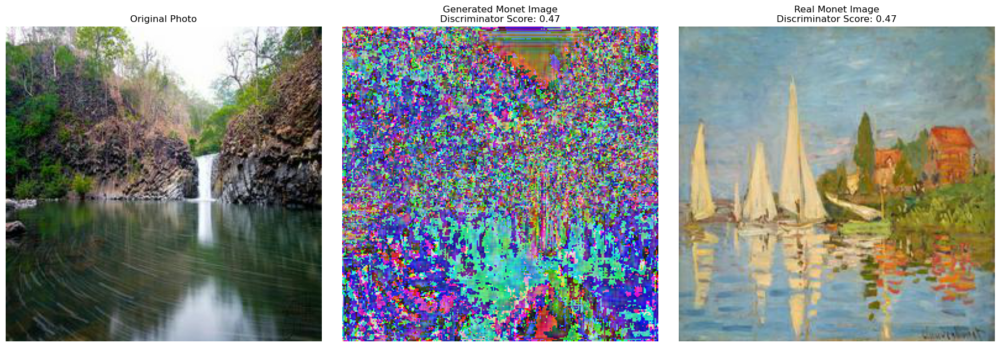

In [123]:
generator = Generator(input_channel=3)
generated_monet = generator(images)

discriminator = Discriminator(input_channel=3)
# Pass the monet and generated images through the discriminator
generated_score = discriminator(generated_monet)
real_score = discriminator(monet)
generated_score = generated_score.mean().item()
real_score = real_score.mean().item()

# Plotting the real photo, generated Monet-like image, and discriminator scores
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Original photo
axes[0].imshow(transforms.ToPILImage()(images.cpu().squeeze()))
axes[0].set_title("Original Photo")
axes[0].axis('off')

# Generated Monet-like image
axes[1].imshow(transforms.ToPILImage()(generated_monet))
axes[1].set_title(f"Generated Monet Image\nDiscriminator Score: {generated_score:.2f}")
axes[1].axis('off')

# Real Monet painting with discriminator score
axes[2].imshow(transforms.ToPILImage()(monet.cpu().squeeze()))
axes[2].set_title(f"Real Monet Image\nDiscriminator Score: {real_score:.2f}")
axes[2].axis('off')

plt.tight_layout()
plt.show()

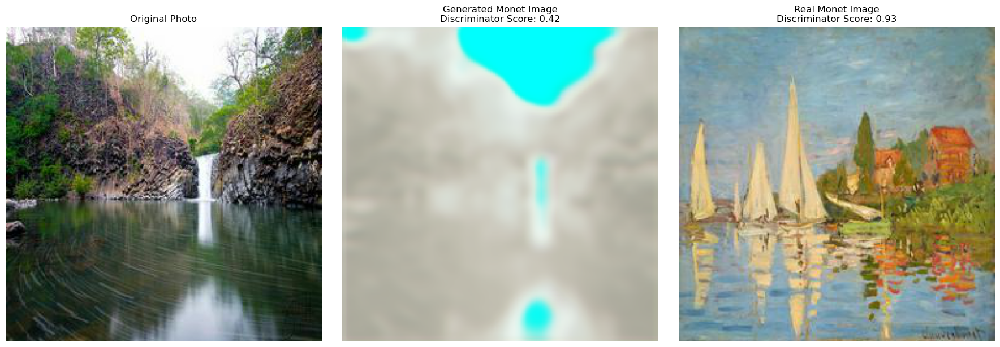

In [124]:
result = gan.test(images, monet)

# Pass the monet and generated images through the discriminator
generated_monet = result[0]["generated_image"]
generated_score = result[0]["generated_score"]
real_score =result[0]["real_score"]
generated_monet =generated_monet .permute(1, 2, 0).numpy() * 0.5 + 0.5 
# img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)


# Plotting the real photo, generated Monet-like image, and discriminator scores
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Original photo
axes[0].imshow(transforms.ToPILImage()(images.cpu().squeeze()))
axes[0].set_title("Original Photo")
axes[0].axis('off')

# Generated Monet-like image
axes[1].imshow(transforms.ToPILImage()(generated_monet))
axes[1].set_title(f"Generated Monet Image\nDiscriminator Score: {generated_score:.2f}")
axes[1].axis('off')

# Real Monet painting with discriminator score
axes[2].imshow(transforms.ToPILImage()(monet.cpu().squeeze()))
axes[2].set_title(f"Real Monet Image\nDiscriminator Score: {real_score:.2f}")
axes[2].axis('off')

plt.tight_layout()
plt.show()